## Requirement: Python >= 3.11
### LangSmith
- Ability to track based on projects
- Able to monitor usage (Trace Count, Trace Latency, Trace Error Rate, LLM count, LLM latency, Cost and Tokens, etc.)
- Instruction on how to set up LangSmith for tracing https://docs.smith.langchain.com/observability

In [1]:
from typing import Annotated
from typing_extensions import TypedDict
from langgraph.graph import START, END
from langgraph.graph.state import StateGraph
from langgraph.graph.message import add_messages
from langgraph.prebuilt import ToolNode, tools_condition
from langchain_core.tools import tool
from langchain_core.messages import BaseMessage
from langchain_tavily import TavilySearch
import os
from dotenv import load_dotenv
load_dotenv()

True

In [ ]:
os.environ['GROQ_API_KEY'] = os.getenv('GROQ_API_KEY')
os.environ['LANGSMITH_API_KEY'] = os.getenv('LANGSMITH_API_KEY')
os.environ['LANGSMITH_TRACING'] = 'true'

In [3]:
### Graph with tool call
from langchain_core.tools import tool
from langchain.chat_models import init_chat_model

class State(TypedDict):
    messages:Annotated[list[BaseMessage], add_messages]

llm = init_chat_model('groq:llama3-8b-8192')

@tool
def add(a:float, b:float) -> float:
    """
    Add two numbers

    Args:
        a (float): first float
        b (float): second float
    
    Returns:
        float: output float
    """
    return a+b

search_tool = TavilySearch(max_results=2)

tools = [search_tool, add]
tool_node = ToolNode(tools)

llm_with_tool = llm.bind_tools(tools)

def call_llm_model(state:State):
    return {'messages': [llm_with_tool.invoke(state['messages'])]}

### Graph
builder = StateGraph(State)

### Node definition
builder.add_node('tool_calling_llm', call_llm_model)
builder.add_node('tools', ToolNode(tools))

### Add Edges
builder.add_edge(START, 'tool_calling_llm')
builder.add_conditional_edges(
    'tool_calling_llm',
    tools_condition
)
builder.add_edge('tools', 'tool_calling_llm')

### Compile Graph
graph = builder.compile()

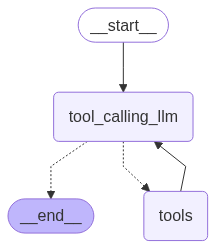

In [4]:
### Visualize the graph
from IPython.display import Image, display
display(Image(graph.get_graph().draw_mermaid_png()))

In [5]:
response=graph.invoke({"messages":"what is 5 plus 20"})

In [6]:
response

{'messages': [HumanMessage(content='what is 5 plus 20', additional_kwargs={}, response_metadata={}, id='6c277b91-e357-44ef-bddf-278bb9525375'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'gf20avbvs', 'function': {'arguments': '{"a":5,"b":20}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 68, 'prompt_tokens': 2882, 'total_tokens': 2950, 'completion_time': 0.070957265, 'prompt_time': 0.320912417, 'queue_time': 0.04669657, 'total_time': 0.391869682}, 'model_name': 'llama3-8b-8192', 'system_fingerprint': 'fp_346a0f709e', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None}, id='run--2d515c2c-c177-43e9-9629-df2f75be671e-0', tool_calls=[{'name': 'add', 'args': {'a': 5, 'b': 20}, 'id': 'gf20avbvs', 'type': 'tool_call'}], usage_metadata={'input_tokens': 2882, 'output_tokens': 68, 'total_tokens': 2950}),
  ToolMessage(content='25.0', name='add', id='1812c5ac-8403-4129-88f8-acda061756b7', tool_call_i

In [7]:
response = graph.invoke({'messages': 'What is machine learning?'})

In [8]:
response

{'messages': [HumanMessage(content='What is machine learning?', additional_kwargs={}, response_metadata={}, id='914adfb6-8489-41a5-9b16-de7283ac026e'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': '50knhz78x', 'function': {'arguments': '{"query":"What is machine learning?","search_depth":"advanced","topic":"general"}', 'name': 'tavily_search'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 82, 'prompt_tokens': 2880, 'total_tokens': 2962, 'completion_time': 0.085447726, 'prompt_time': 0.320599565, 'queue_time': 0.04737581, 'total_time': 0.406047291}, 'model_name': 'llama3-8b-8192', 'system_fingerprint': 'fp_346a0f709e', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None}, id='run--33a87879-e9b3-495a-9a7a-12b37fc90995-0', tool_calls=[{'name': 'tavily_search', 'args': {'query': 'What is machine learning?', 'search_depth': 'advanced', 'topic': 'general'}, 'id': '50knhz78x', 'type': 'tool_call'}], usage_metadata=

#### Observation
- After running the codes above, we can go back to LangSmith and view the individual responses (both inputs and outputs) for each LLM invoke.
- Go to `LangSmith > Tracing Projects > default`


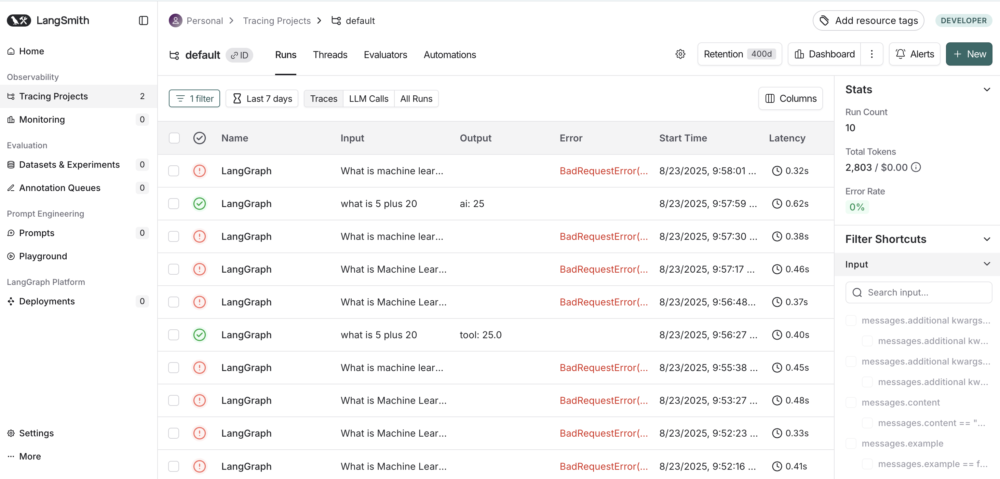
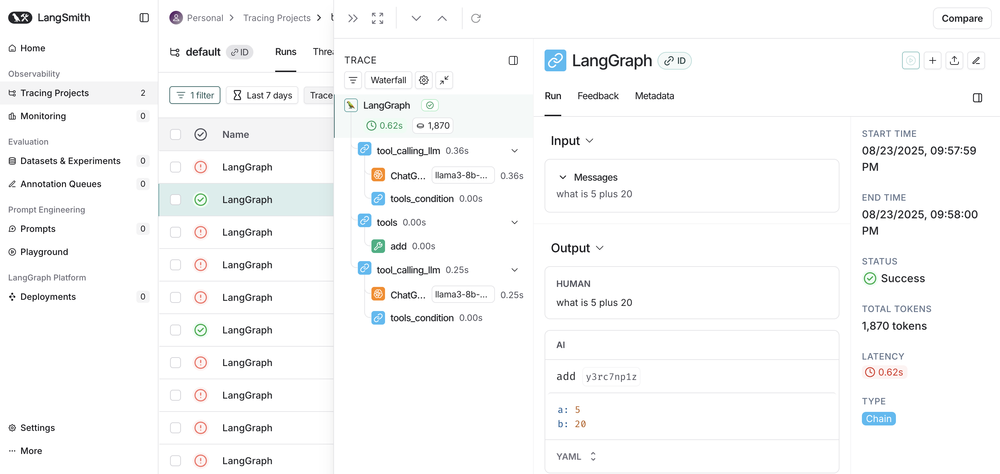
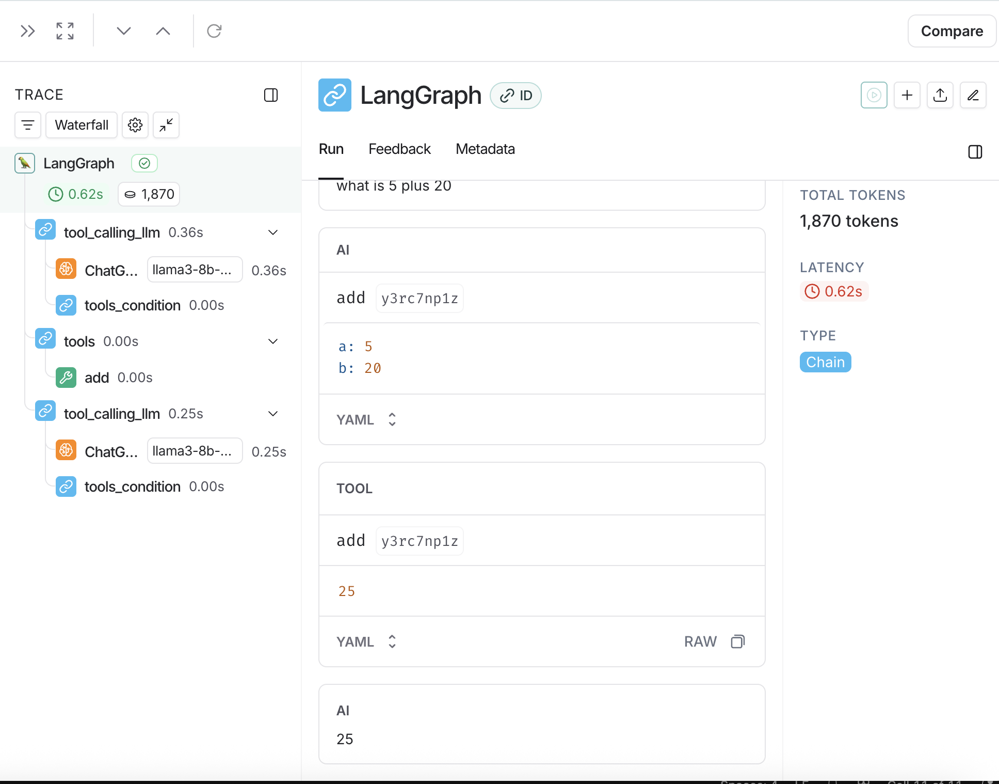

- We can see for each call, what are the exact steps/tools the LLM used to derive the answer.
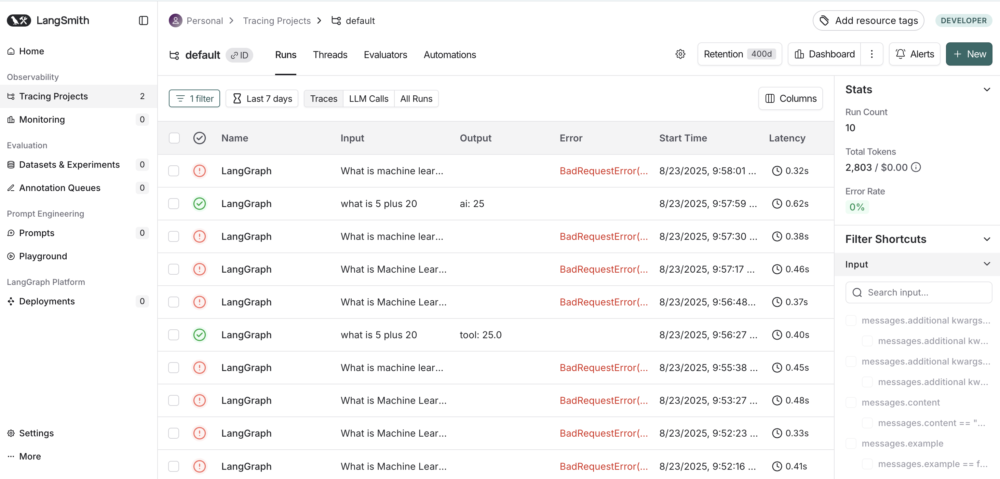
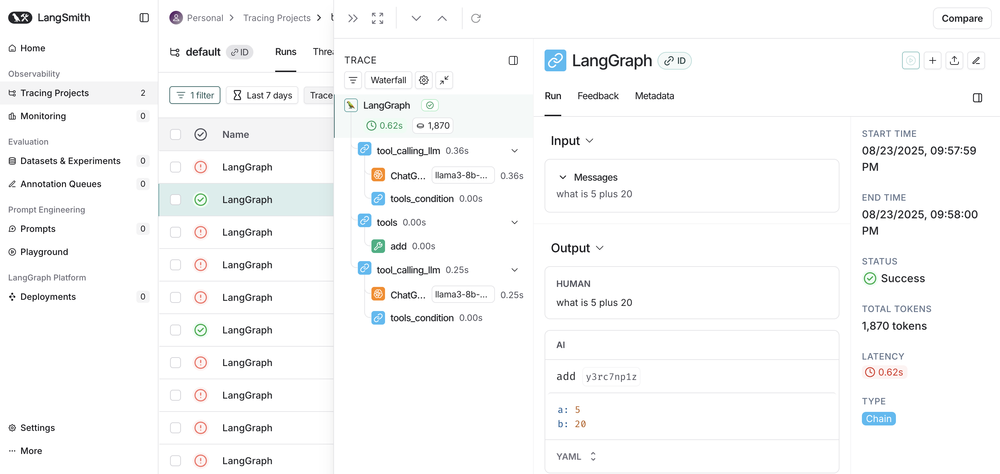
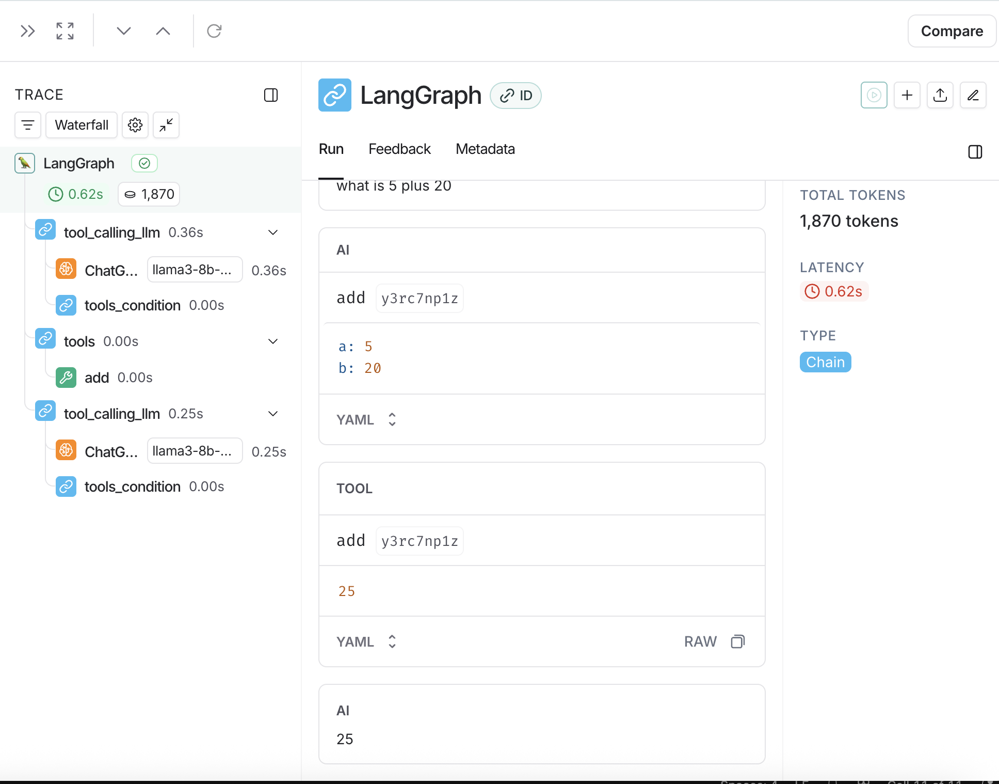

### Setup LangSmith to selectively trace and save into a specific project name
- Below's example shows how to selectively trace items

In [ ]:
import langsmith as ls
client = ls.Client(
    api_key=os.getenv('LANGSMITH_API_KEY'),  # This can be retrieved from a secrets manager
    api_url="https://api.smith.langchain.com",  # Update appropriately for self-hosted installations or the EU region
)

### Graph with tool call
from langchain_core.tools import tool
from langchain.chat_models import init_chat_model

class State(TypedDict):
    messages:Annotated[list[BaseMessage], add_messages]

llm = init_chat_model('groq:llama3-8b-8192')

@tool
def add(a:float, b:float) -> float:
    """
    Add two numbers

    Args:
        a (float): first float
        b (float): second float
    
    Returns:
        float: output float
    """
    return a+b

search_tool = TavilySearch(max_results=2)

tools = [search_tool, add]
tool_node = ToolNode(tools)

llm_with_tool = llm.bind_tools(tools)

def call_llm_model(state:State):
    return {'messages': [llm_with_tool.invoke(state['messages'])]}

### Graph
builder = StateGraph(State)

### Node definition
builder.add_node('tool_calling_llm', call_llm_model)
builder.add_node('tools', ToolNode(tools))

### Add Edges
builder.add_edge(START, 'tool_calling_llm')
builder.add_conditional_edges(
    'tool_calling_llm',
    tools_condition
)
builder.add_edge('tools', 'tool_calling_llm')

### Compile Graph
graph = builder.compile()

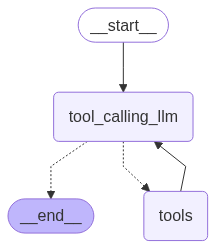

In [40]:
### Visualize the graph
from IPython.display import Image, display
display(Image(graph.get_graph().draw_mermaid_png()))

In [33]:
with ls.tracing_context(client=client, project_name="TestProject", enabled=True):
    response=graph.invoke({"messages":"what is 5 + 20"})
response

{'messages': [HumanMessage(content='what is 5 + 20', additional_kwargs={}, response_metadata={}, id='6b0fa543-e145-4aeb-bc64-449196c98aa9'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'rnhbwk54e', 'function': {'arguments': '{"a":5,"b":20}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 116, 'prompt_tokens': 2882, 'total_tokens': 2998, 'completion_time': 0.12112402, 'prompt_time': 0.323852956, 'queue_time': 0.050903134, 'total_time': 0.444976976}, 'model_name': 'llama3-8b-8192', 'system_fingerprint': 'fp_346a0f709e', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None}, id='run--9ab82658-49b1-4526-a318-db643c87d371-0', tool_calls=[{'name': 'add', 'args': {'a': 5, 'b': 20}, 'id': 'rnhbwk54e', 'type': 'tool_call'}], usage_metadata={'input_tokens': 2882, 'output_tokens': 116, 'total_tokens': 2998}),
  ToolMessage(content='25.0', name='add', id='1459bfcf-9849-4a97-9280-558a7c5e2d30', tool_call_id

In [41]:
response = graph.invoke({'messages': 'What is machine learning?'})
response

{'messages': [HumanMessage(content='What is machine learning?', additional_kwargs={}, response_metadata={}, id='1cee30f3-f1fa-4444-9b06-bd00505f9327'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'x4z6jyd9b', 'function': {'arguments': '{"end_date":null,"exclude_domains":[],"include_domains":[],"include_favicon":false,"include_images":false,"query":"What is machine learning?","search_depth":"advanced","start_date":null,"time_range":null,"topic":"general"}', 'name': 'tavily_search'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 130, 'prompt_tokens': 2881, 'total_tokens': 3011, 'completion_time': 0.13695296, 'prompt_time': 0.40372479, 'queue_time': 0.41329555, 'total_time': 0.54067775}, 'model_name': 'llama3-8b-8192', 'system_fingerprint': 'fp_346a0f709e', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None}, id='run--a9e4b19e-aa44-45ca-95a9-3663c833f07d-0', tool_calls=[{'name': 'tavily_search', 'args': {'end_

#### Observation:
- We can choose which lines to track using `.tracing_context`.
- We can set a custom `project_name` in LangSmith to track based on project usage.

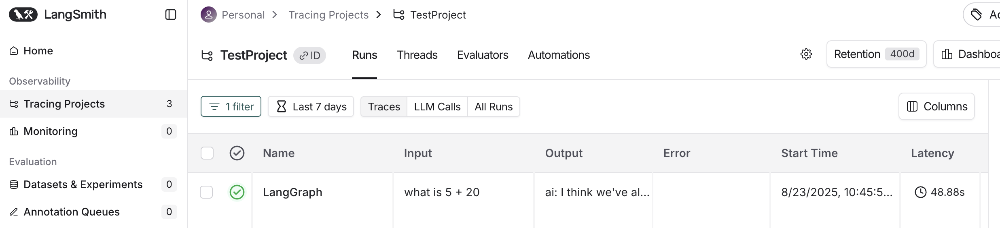
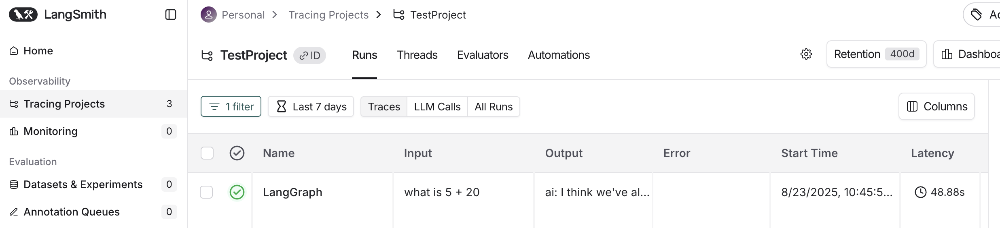

### Setup LangSmith to trace in a specific project name by default
- Restart Kernel and run the codes below. Otherwise it will not trace under `default` instead of `project_name`

In [9]:
os.environ['GROQ_API_KEY'] = os.getenv('GROQ_API_KEY')
os.environ['LANGSMITH_API_KEY'] = os.getenv('LANGSMITH_API_KEY')
os.environ['LANGSMITH_TRACING'] = 'true'
os.environ['LANGSMITH_PROJECT'] = 'TestProject'

In [10]:
### Graph with tool call
from langchain_core.tools import tool
from langchain.chat_models import init_chat_model

class State(TypedDict):
    messages:Annotated[list[BaseMessage], add_messages]

llm = init_chat_model('groq:llama3-8b-8192')

@tool
def add(a:float, b:float) -> float:
    """
    Add two numbers

    Args:
        a (float): first float
        b (float): second float
    
    Returns:
        float: output float
    """
    return a+b

search_tool = TavilySearch(max_results=2)

tools = [search_tool, add]
tool_node = ToolNode(tools)

llm_with_tool = llm.bind_tools(tools)

def call_llm_model(state:State):
    return {'messages': [llm_with_tool.invoke(state['messages'])]}

### Graph
builder = StateGraph(State)

### Node definition
builder.add_node('tool_calling_llm', call_llm_model)
builder.add_node('tools', ToolNode(tools))

### Add Edges
builder.add_edge(START, 'tool_calling_llm')
builder.add_conditional_edges(
    'tool_calling_llm',
    tools_condition
)
builder.add_edge('tools', 'tool_calling_llm')

### Compile Graph
graph = builder.compile()

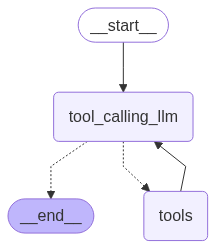

In [11]:
### Visualize the graph
from IPython.display import Image, display
display(Image(graph.get_graph().draw_mermaid_png()))

In [12]:
response=graph.invoke({"messages":"what is 5 + 20"})
response

{'messages': [HumanMessage(content='what is 5 + 20', additional_kwargs={}, response_metadata={}, id='050b88e4-02e2-48d4-bf62-2ab7a3c764b4'),
  AIMessage(content='', additional_kwargs={'tool_calls': [{'id': 'm62gn57ey', 'function': {'arguments': '{"a":5,"b":20}', 'name': 'add'}, 'type': 'function'}]}, response_metadata={'token_usage': {'completion_tokens': 68, 'prompt_tokens': 2882, 'total_tokens': 2950, 'completion_time': 0.071618912, 'prompt_time': 0.323437083, 'queue_time': 0.045688298, 'total_time': 0.395055995}, 'model_name': 'llama3-8b-8192', 'system_fingerprint': 'fp_346a0f709e', 'service_tier': 'on_demand', 'finish_reason': 'tool_calls', 'logprobs': None}, id='run--eb12fb71-73a4-4027-8dc3-7740c2899c0f-0', tool_calls=[{'name': 'add', 'args': {'a': 5, 'b': 20}, 'id': 'm62gn57ey', 'type': 'tool_call'}], usage_metadata={'input_tokens': 2882, 'output_tokens': 68, 'total_tokens': 2950}),
  ToolMessage(content='25.0', name='add', id='8247dd5f-e49f-47fe-bb31-b6157b507f70', tool_call_id=

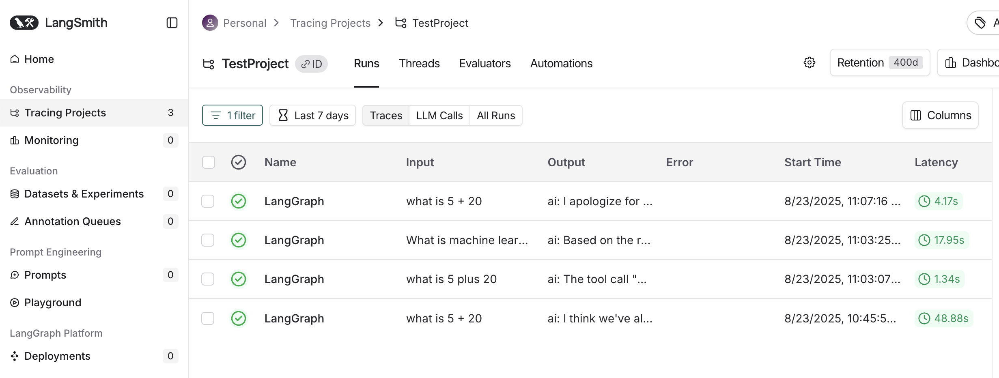
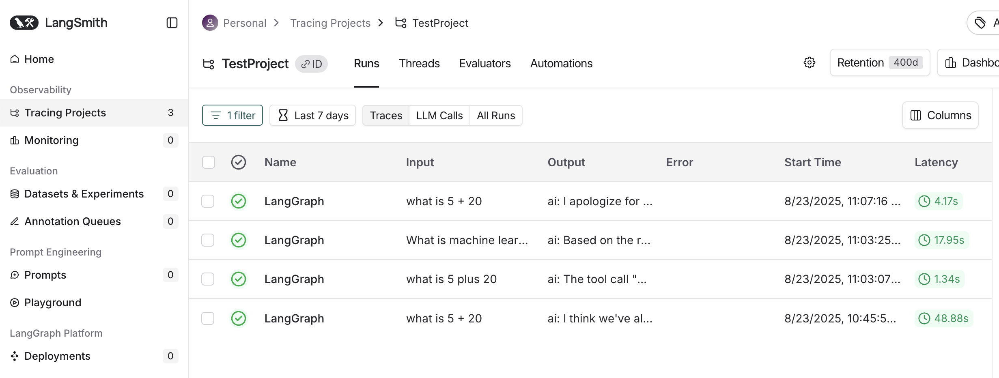

### LangGraph Studio
- **Requirement**: Python >= 3.11
- Set up agent.py
- Set up langgraph.json
    - This file tells the LangGraph Studio to look for agent.py, use tool_agent, and use the API keys within .env file.
- Open a terminal, cd into the folder `2. Debugging-and-Monitoring`
- Enter `langgraph dev`. This function will use the langgraph.json file to find out which file to use, which function to call, where to retrieve API key etc.

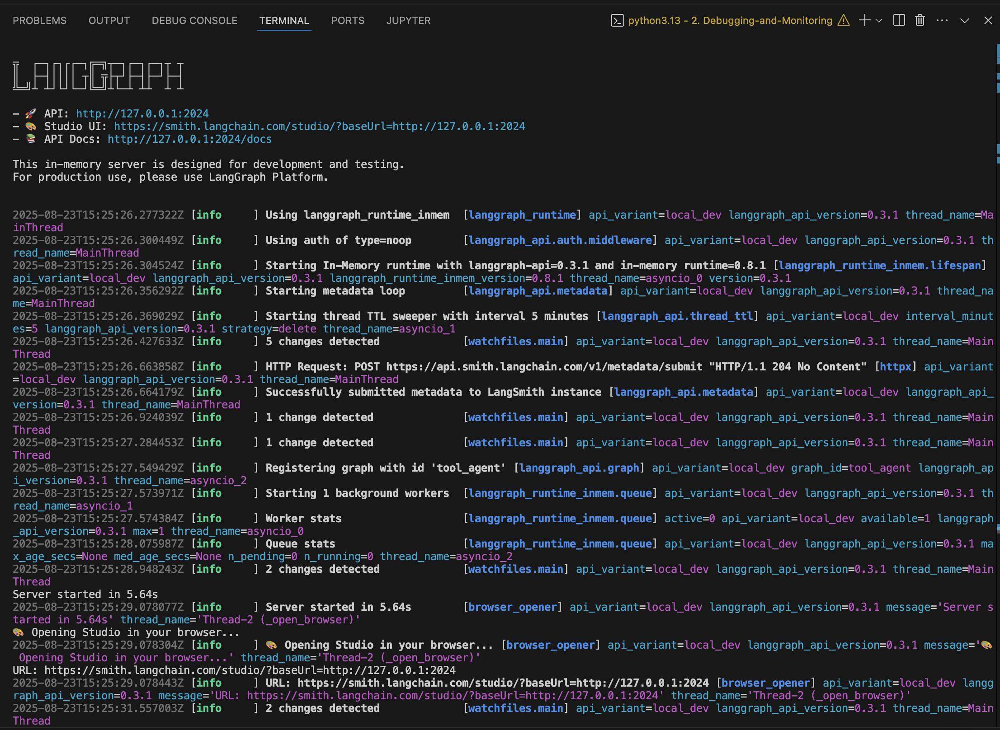

- A LangSmith Studio will be launched in Web Browser
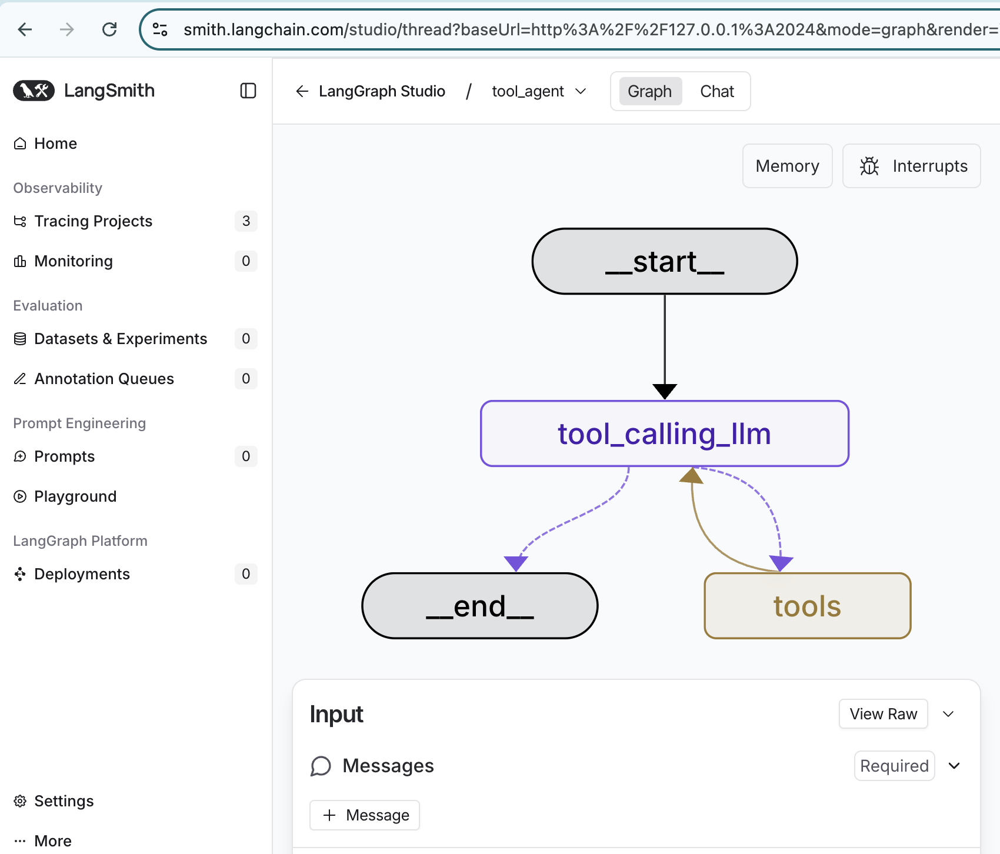
- You can use the platform to directly invoke message.

- We can also access API document here: http://127.0.0.1:2024/docs
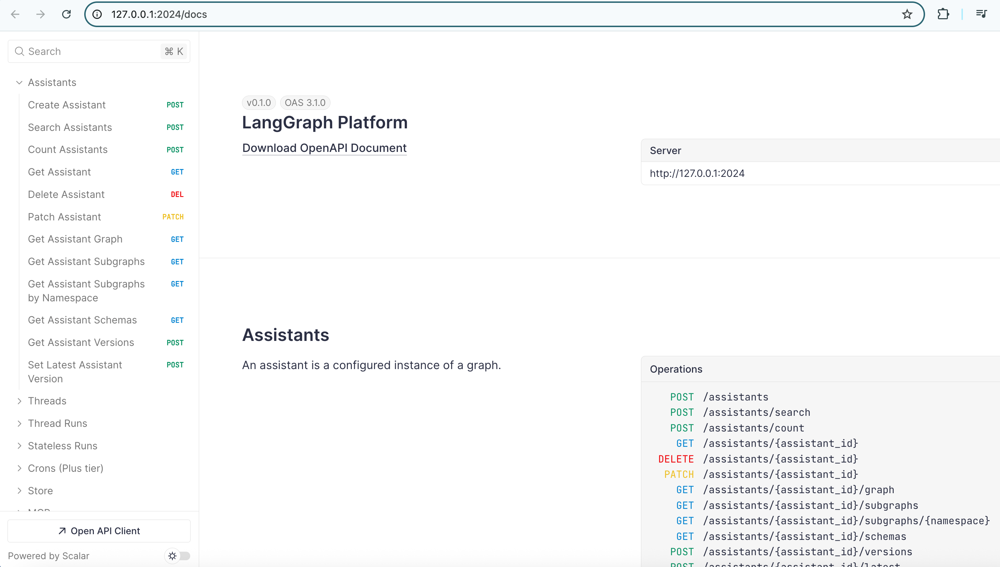
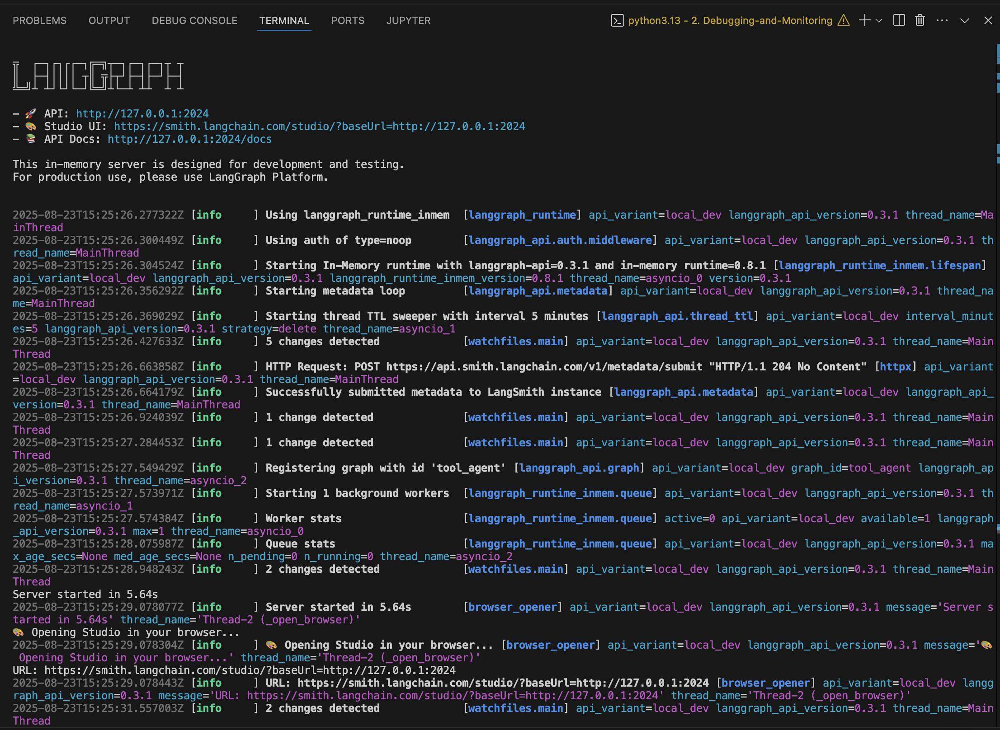
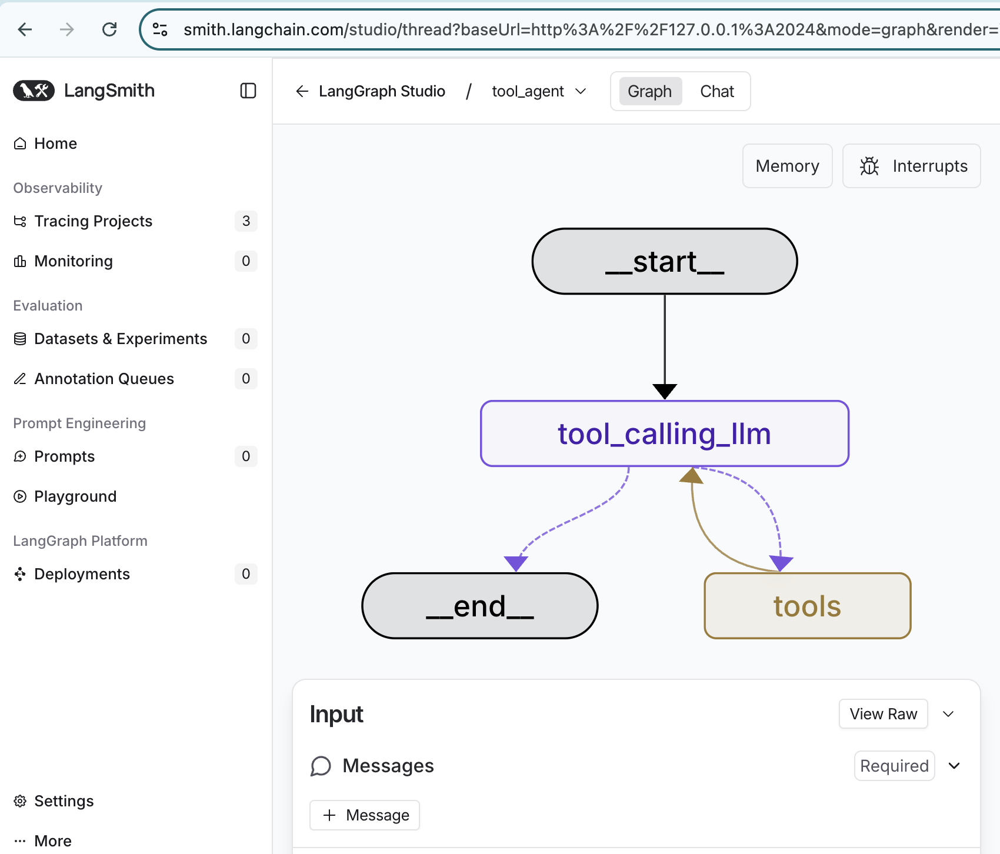
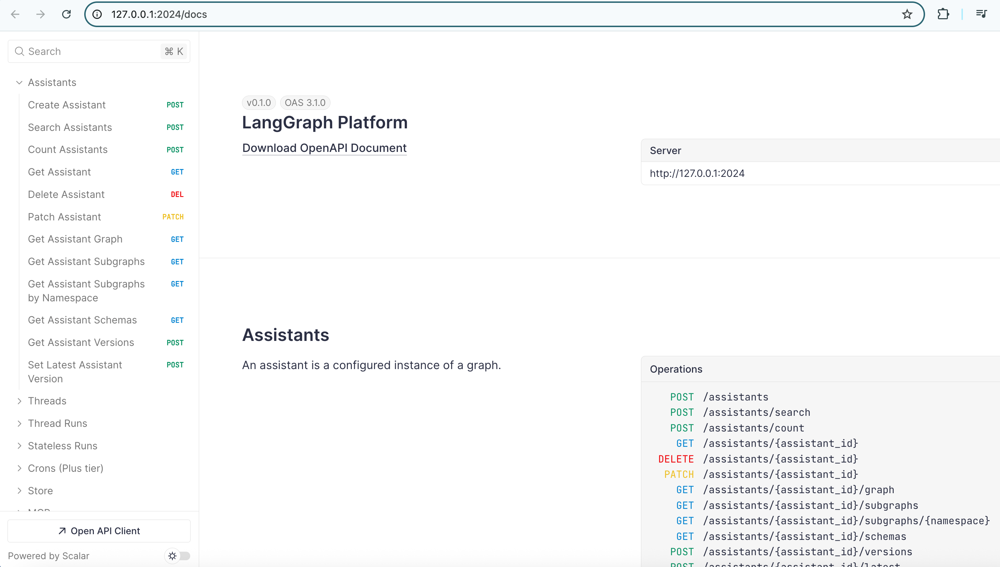

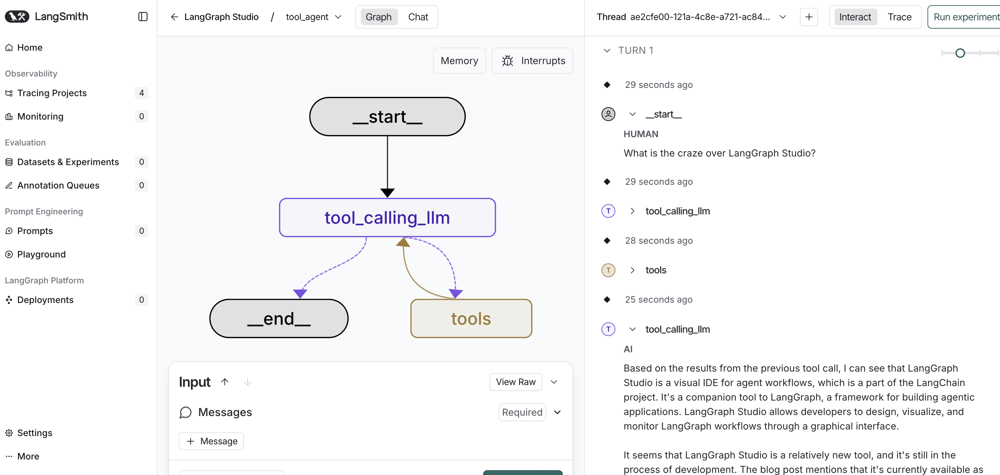
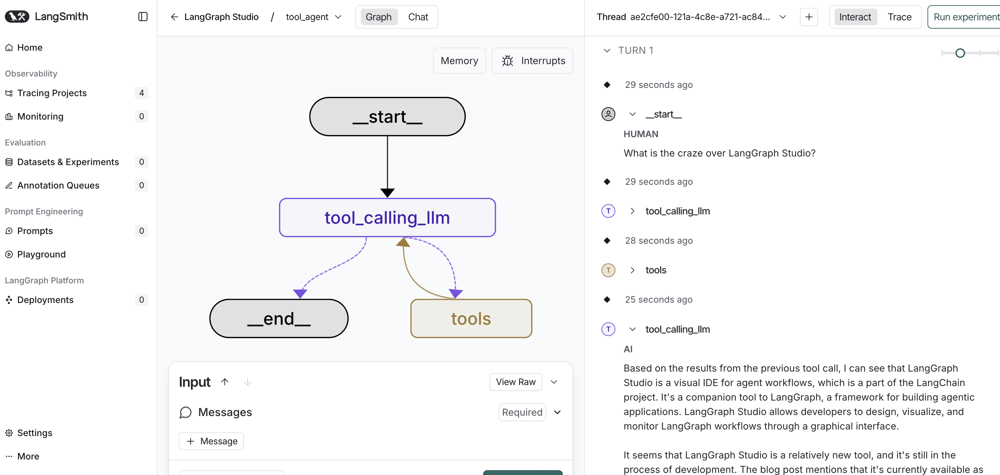